In [1]:
import tension_calculate as tc
import pretty_midi
import os


%matplotlib notebook

import matplotlib.pyplot as plt
import numpy as np

import matplotlib.animation as animation

import IPython.display

from IPython.display import Audio

### 1. read the midi file

return pretty midi object without drum track, chord name and chord pianoroll for every half note

In [2]:
pm,chord_names,chord_note,beats = tc.extract_notes('example/input/abc.mid','example/output')

In [3]:
# time_change_beat = []
# for time_change in pm.time_signature_changes:
#     time_change_beat.append(np.where(time_change.time == new_beats[::2])[0][0])

### 2. call cal_tension

Return tensile_strain, diameters, centroid difference for every bar.
If the last parameter is 1, then those is calculated for every half note.
The key for the song and key change place is also returned.
If no key change detected, key_change_bar=-1

In [4]:
# every two eight beat output a tension output
beat_interval = 2

<IPython.core.display.Javascript object>


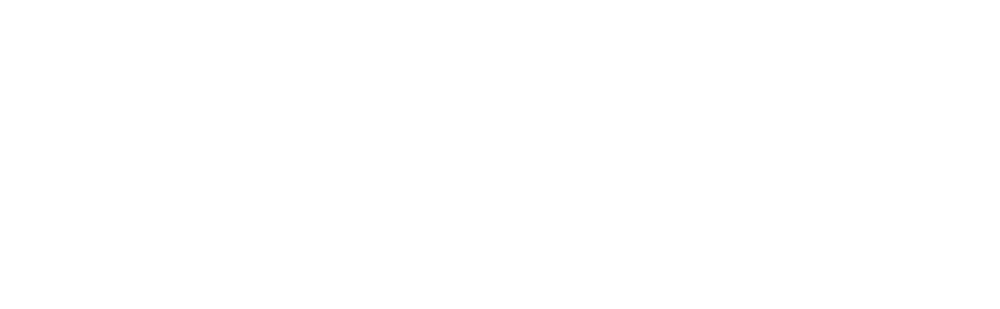

<IPython.core.display.Javascript object>


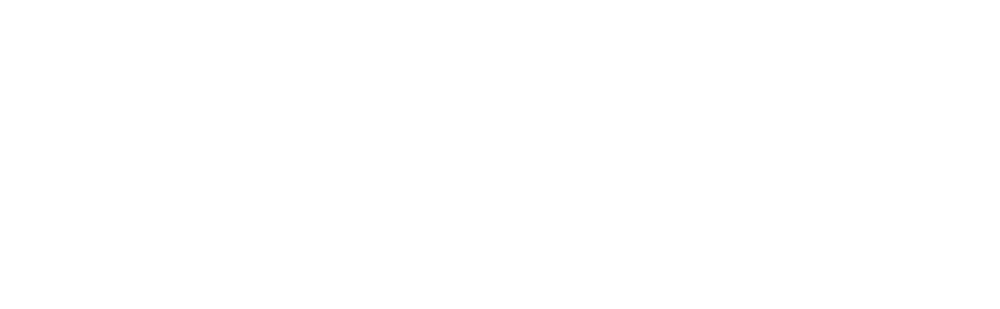

<IPython.core.display.Javascript object>


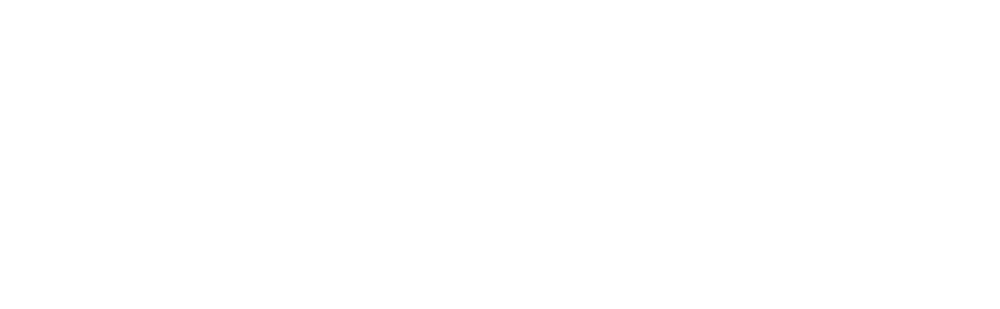

In [5]:
tensile_strain, diameters, centroid_diff, key_name,key_change_bar,key_change_name,new_beats = tc.cal_tension('example/input/abc.mid',pm,beats,'example/output', beat_interval)

In [6]:

print(f'key name is {key_name}')
print(f'key change bar is {key_change_bar}')


key name is major C
key change bar is 58


### 3. Draw the tensile strain

In [8]:
Audio(pm.synthesize(fs=16000), rate=16000,autoplay=True)

In [7]:
interval = (new_beats[10] - new_beats[9]) * 4 * 1000

In [12]:
def draw_two(frame):
    
    
    if frame == len(tensile_strain): 
        a.event_source.stop()

#     if frame == 20:
#         a.event_source.interval /= 2
#     if frame == 21:
#         a.event_source.interval *= 2
#     if frame == 43:
#         a.event_source.interval /= 2
#     if frame == 44:
#         a.event_source.interval *= 2
        
    plt.cla()
    print(frame)
    plt.annotate('n = {}'.format(frame), [1,0.8])
#     plt.rcParams['xtick.labelsize'] = 6
    F = plt.gcf()
    values = np.array(diameters)
    values1 = np.array(centroid_diff)
#     F.set_size_inches(len(values)/7+5, 5)
    plt.axis([1,len(values) + 1,0,1])
    xtick = range(1,len(values) + 1,2)


    plt.xticks(xtick)
    minimum = np.min(values[values!=0])
    maximum = np.max(values)
    plt.ylim(0, maximum)
#     ytick = range(0,maximum,0.2)
#     plt.yticks(ytick)
    plt.plot(values[:frame+2],'-o',values1[:frame+2], '-or',markersize=3)
   
    plt.xlabel('Bars')
    plt.ylabel('Tension')
    plt.title('diameter and centroid difference')
    plt.legend(['diameter','centroid difference'])
    
    
    

<IPython.core.display.Javascript object>


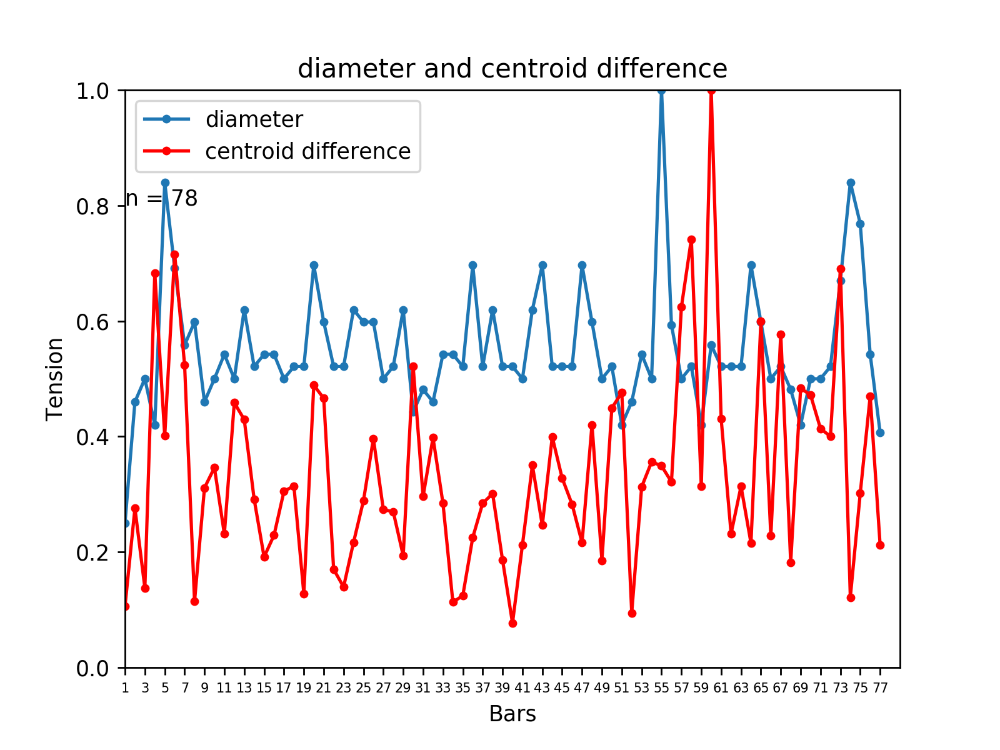

In [13]:

fig = plt.figure()
a = animation.FuncAnimation(fig, draw_two, blit=True,interval=interval)

In [15]:
def draw_tensile_strain(frame):
    
    
    if frame == len(tensile_strain): 
        a.event_source.stop()

#     if frame == 20:
#         a.event_source.interval /= 2
#     if frame == 21:
#         a.event_source.interval *= 2
#     if frame == 43:
#         a.event_source.interval /= 2
#     if frame == 44:
#         a.event_source.interval *= 2
        
    plt.cla()
    print(frame)
    plt.annotate('n = {}'.format(frame), [1,0.8])
#     plt.rcParams['xtick.labelsize'] = 6
    F = plt.gcf()
    values = np.array(tensile_strain)
#     F.set_size_inches(len(values)/7+5, 5)
    plt.axis([1,len(values) + 1,0,1])
    xtick = range(1,len(values) + 1,2)


    plt.xticks(xtick)
    minimum = np.min(values[values!=0])
    maximum = np.max(values)
    plt.ylim(minimum, maximum)
#     ytick = range(0,maximum,0.2)
#     plt.yticks(ytick)
    plt.plot(values[:frame+2],'-o',markersize=3)
   
    plt.xlabel('Bars')
    plt.ylabel('Tension')
    plt.title('Tensile strain')
    
    
    

<IPython.core.display.Javascript object>


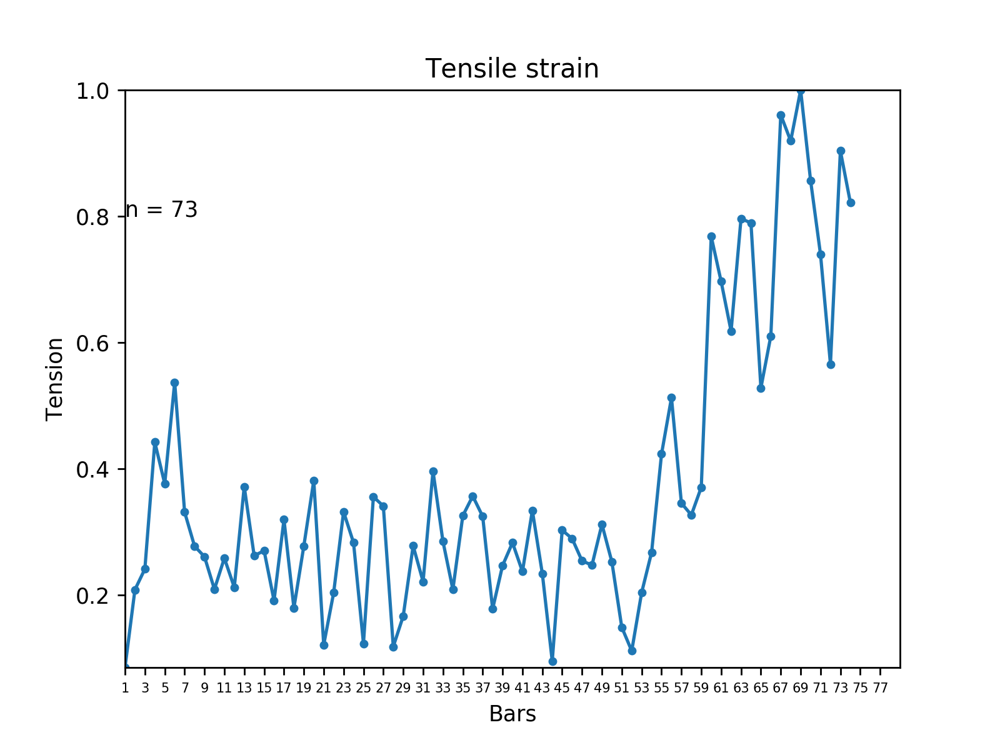

In [16]:

fig = plt.figure()
a = animation.FuncAnimation(fig, draw_tensile_strain, blit=True,interval=interval)

In [18]:
#a.save('result.gif', dpi=80, writer='imagemagick')